In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import pandas as pd
import torch
from transformers import BartTokenizer, BartForConditionalGeneration
import tqdm

In [ ]:
#/content/drive/MyDrive/df/helper_f.py
#import helper function

import sys
sys.path.append('/content/drive/MyDrive/df')
from helper_f import *

### masked using attn score

In [ ]:
import spacy
from nltk.corpus import stopwords
import nltk
from transformers import DistilBertTokenizer, DistilBertForSequenceClassification
import pandas as pd

# Load spaCy model for NER
nlp = spacy.load('en_core_web_sm')


/usr/local/lib/python3.10/dist-packages/spacy/util.py:1740: UserWarning: [W111] Jupyter notebook detected: if using `prefer_gpu()` or `require_gpu()`, include it in the same cell right before `spacy.load()` to ensure that the model is loaded on the correct device. More information: http://spacy.io/usage/v3#jupyter-notebook-gpu
  warnings.warn(Warnings.W111)


In [ ]:
# df = pd.read_csv('/content/drive/MyDrive/df/final_df_masked.csv')
df = pd.read_csv('/content/drive/MyDrive/df/final_df.csv', encoding='utf-8')

ft_bias_model = DistilBertForSequenceClassification.from_pretrained('/content/drive/MyDrive/df/bias_fnews_model/bias_distilbert_fine_tuned')
ft_bias_tokenizer = DistilBertTokenizer.from_pretrained('/content/drive/MyDrive/df/bias_fnews_model/bias_distilbert_fine_tuned')

ft_fake_news_model = DistilBertForSequenceClassification.from_pretrained('/content/drive/MyDrive/df/bias_fnews_model/fine_tune_fakenews')
ft_fake_news_tokenizer = DistilBertTokenizer.from_pretrained('/content/drive/MyDrive/df/bias_fnews_model/fine_tune_fakenews')


In [ ]:
df.head()

,statement,fake_news,bias
0,Says Planned Parenthood provides about 140 vis...,False,mainstream
1,For the last decade the climate has been cooling.,False,right
2,Says Mitt Romney raised business taxes 20 perc...,True,mainstream
3,On immigration reform,True,mainstream
4,Says Barbara Buono voted to raise her own pay ...,True,mainstream


In [ ]:
len(df)

12178

### XAI

In [ ]:
dffinal = pd.read_csv('/content/drive/MyDrive/df/final_df_pred_left_right_bleuv5.csv', encoding ='utf-8')

In [ ]:

text1 = "hillary clinton playing the poor pitiful little girl against the big bad trump wont work with the terrorist, little kim in korea, iran or russia."
text2 = "hillary clinton the poor pitiful little girl against the big bad trump wont work with the terrorist, little kim in korea, iran or russia."

In [ ]:
! pip install lime
from lime.lime_text import LimeTextExplainer

In [ ]:

def predict_proba(texts):
    inputs = ft_fake_news_tokenizer(texts, return_tensors='pt', padding=True, truncation=True)
    outputs = ft_fake_news_model(**inputs)

    logits = outputs.logits
    probs = logits.softmax(dim=1).detach().numpy()

    return probs

def predict_proba_bias(texts):
    inputs = ft_bias_tokenizer(texts, return_tensors='pt', padding=True, truncation=True)
    outputs = ft_bias_model(**inputs)

    logits = outputs.logits
    probs = logits.softmax(dim=1).detach().numpy()

    return probs


In [ ]:
btext1 = "Montel Williams isn't afraid to express his absolute disgust and disdain for Republican nominee Donald Trump a heas made it perfectly clear in the past that he would never support or vote for him, and continuously speaks out against the business mogul. Thatas why there was nothing unusual about what Williams did over the weekend, when the radio talk show host called out one of Trumpas biggest supporters a Pastor Mark Burns. When Williams saw Burns complaining about the media."

btext2 = "Montel Williams isn't afraid to express his absolute disgust and disdain for Republican nominee Donald Trump a He made it perfectly clear in the past that he would never support or vote for him, and continuously speaks out against the business mogul. That's why there was nothing unusual about what Williams did over the weekend, when the radio talk show host called out one of Trump's biggest supporters a pastor Mark Burns. When Williams saw Burns complaining about the media"

In [ ]:
classes_label = ['mainstream', 'left', 'right']

explainerB = LimeTextExplainer(class_names= classes_label)

explanation_B = explainerB.explain_instance(btext1, predict_proba_bias, num_features=5, num_samples=1000)

# Display the explanation
explanation_B.show_in_notebook()

In [ ]:
explanation_B = explainerB.explain_instance(btext2, predict_proba_bias, num_features=5, num_samples=1000)

# Display the explanation
explanation_B.show_in_notebook()

In [ ]:

explainer = LimeTextExplainer(class_names=[False, True])
explanation = explainer.explain_instance(btext1, predict_proba, num_features=5, num_samples=1000)

# Display the explanation
explanation.show_in_notebook()

In [ ]:
explanation = explainer.explain_instance(btext2, predict_proba, num_features=5, num_samples=1000)

# Display the explanation
explanation.show_in_notebook()

In [ ]:
#right gold std false
text_right = "A company with 20 employees could go out of business because of health care law requirements to buy insurance."

text_left = "There are health care law requirements that could cause a company with a neutral term for right bias to go out of business."

explanation = explainer.explain_instance(text_right, predict_proba, num_features=5, num_samples=1000)

# Display the explanation
explanation.show_in_notebook()


In [ ]:
explanation = explainer.explain_instance(text_left, predict_proba, num_features=5, num_samples=1000)

# Display the explanation
explanation.show_in_notebook()

In [ ]:
classes_label = ['mainstream', 'left', 'right']

explainerO = LimeTextExplainer(class_names= classes_label)

explanation_O = explainerO.explain_instance(text_right, predict_proba_bias, num_features=5, num_samples=1000)

# Display the explanation
explanation_O.show_in_notebook()

In [ ]:
explainerP = LimeTextExplainer(class_names= classes_label)

explanation_P = explainerP.explain_instance(text_left, predict_proba_bias, num_features=5, num_samples=1000)

# Display the explanation
explanation_P.show_in_notebook()

### dataset

In [ ]:
df2 = pd.read_csv('/content/drive/MyDrive/df/combined_bias_fact_ignore_mixed.csv')

#filter out unk bias
df2 = df2[df2['bias'] != 'unk']

df2.head()

In [ ]:
df2.bias.value_counts()

bias
mainstream    814
right         380
left          192
Name: count, dtype: int64

In [ ]:
#rename harmonized_label to fact
df2.rename(columns={'harmonized_label': 'fact'}, inplace=True)

df2.head()

,statement,fact,bias
8059,With the Hillary Clinton-Donald Trump debates ...,True,mainstream
8060,As police today captured the man wanted for qu...,True,mainstream
8061,One day after explosive devices were discovere...,True,mainstream
8062,"Ahmad Khan Rahami, earlier named a person of i...",True,mainstream
8063,Donald Trump's surrogates and leading supporte...,True,mainstream


In [ ]:
#sample 200 of mainstream

# sample_100_mainstream = df[df['bias'] == 'mainstream'].sample(n=200, random_state=42)

# len(sample_100_mainstream)

mainstream_sample = df2[df2['bias'] == 'mainstream'].sample(n=200, random_state=42)

len(mainstream_sample)

200

In [ ]:
# import torch
# from transformers import BertTokenizer, BertForSequenceClassification
# import nltk
# from nltk.corpus import stopwords
# import spacy

# nltk.download('stopwords')

# def word2mask(sentence, model, tokenizer, nlp, top_k=0.2):

#     stop_words = set(stopwords.words('english'))
#     additional_avoid_words = set(['.', ',', '!', '?','(',')', "'",'"','is','am', 'are', 'was', 'were'
#                               , 'be', 'being', 'been', 'am', 'do', 'does', 'did'
#                               , 'have', 'has', 'had'])
#     avoid_words = stop_words.union(additional_avoid_words)
#     # Tokenize the input sentence
#     inputs = tokenizer(sentence, return_tensors='pt',
#                        truncation=True, padding=True,
#                         max_length=512)

#     # Ensure the model outputs attentions
#     outputs = model(**inputs, output_attentions=True)

#     # Extract attention scores
#     attentions = outputs.attentions[-1]  # Get attention from the last layer

#     # Average attention scores across heads and tokens
#     attention_scores = attentions.mean(dim=1).squeeze(0).mean(dim=0)  # Average over heads and batch dimension, keep token dimension

#     # Get the tokenized input tokens
#     tokens = tokenizer.convert_ids_to_tokens(inputs['input_ids'].squeeze())

#     # Use spaCy NER to identify named entities
#     doc = nlp(sentence)
#     ner_indices = set()

#     # Manually map character-level positions to token-level
#     token_offsets = []
#     current_char_index = 0
#     for token in tokens:
#         if token in ['[CLS]', '[SEP]', '[PAD]', '<mask>']:
#             token_offsets.append((current_char_index, current_char_index))
#             continue
#         current_char_index = sentence.find(token.replace('##', ''), current_char_index)
#         token_offsets.append((current_char_index, current_char_index + len(token.replace('##', ''))))
#         current_char_index += len(token.replace('##', ''))

#     for ent in doc.ents:
#         for idx, (start, end) in enumerate(token_offsets):
#             if start >= ent.start_char and end <= ent.end_char:
#                 ner_indices.add(idx)

#     # Ignore special tokens, stopwords, and additional avoid words
#     valid_indices = [i for i, token in enumerate(tokens) if token.lower() not in avoid_words and token not in ['[CLS]', '[SEP]', '[PAD]', '<mask>']]

#     # Ensure NER indices are considered in valid indices
#     valid_indices = list(set(valid_indices + list(ner_indices)))

#     # Filter attention scores for valid tokens
#     filtered_attention_scores = attention_scores[valid_indices]
#     filtered_tokens = [tokens[i] for i in valid_indices]

#     # Identify top-k% tokens based on filtered attention scores
#     num_tokens_to_mask = int(len(filtered_tokens) * top_k)
#     top_k_indices = torch.topk(filtered_attention_scores, num_tokens_to_mask, largest=True).indices.tolist()

#     # Collect tokens to be masked
#     masked_tokens_list = [filtered_tokens[idx] for idx in top_k_indices]

#     return masked_tokens_list

import torch
from transformers import BertTokenizer, BertForSequenceClassification
import nltk
from nltk.corpus import stopwords
import spacy

nltk.download('stopwords')

def word2mask(sentence, model, tokenizer, nlp, top_k=0.2):
    stop_words = set(stopwords.words('english'))
    additional_avoid_words = set(['.', ',', '!', '?', '(', ')', "'", '"', 'is', 'am', 'are', 'was', 'were',
                                  'be', 'being', 'been', 'am', 'do', 'does', 'did',
                                  'have', 'has', 'had'])
    avoid_words = stop_words.union(additional_avoid_words)

    # Tokenize the input sentence
    inputs = tokenizer(sentence, return_tensors='pt', truncation=True, padding=True, max_length=512)

    # Ensure the model outputs attentions
    outputs = model(**inputs, output_attentions=True)

    # Extract attention scores
    attentions = outputs.attentions[-1]  # Get attention from the last layer

    # Average attention scores across heads and tokens
    attention_scores = attentions.mean(dim=1).squeeze(0).mean(dim=0)  # Average over heads and batch dimension, keep token dimension

    # Get the tokenized input tokens
    tokens = tokenizer.convert_ids_to_tokens(inputs['input_ids'].squeeze())

    # Use spaCy NER to identify named entities
    doc = nlp(sentence)
    ner_indices = set()

    # Manually map character-level positions to token-level
    token_offsets = []
    current_char_index = 0
    for token in tokens:
        if token in ['[CLS]', '[SEP]', '[PAD]', '<mask>']:
            token_offsets.append((current_char_index, current_char_index))
            continue
        token_str = token.replace('##', '')
        start_idx = sentence.find(token_str, current_char_index)
        end_idx = start_idx + len(token_str)
        token_offsets.append((start_idx, end_idx))
        current_char_index = end_idx

    for ent in doc.ents:
        for idx, (start, end) in enumerate(token_offsets):
            if start >= ent.start_char and end <= ent.end_char:
                ner_indices.add(idx)

    # Ignore special tokens, stopwords, and additional avoid words
    valid_indices = [i for i, token in enumerate(tokens)
                     if token.lower() not in avoid_words and token not in ['[CLS]', '[SEP]', '[PAD]', '<mask>']]

    # Ensure NER indices are considered in valid indices
    valid_indices = list(set(valid_indices + list(ner_indices)))

    # Filter attention scores for valid tokens
    filtered_attention_scores = attention_scores[valid_indices]
    filtered_tokens = [tokens[i] for i in valid_indices]

    # Identify top-k% tokens based on filtered attention scores
    num_tokens_to_mask = max(1, int(len(filtered_tokens) * top_k))  # Ensure at least one token is masked
    top_k_indices = torch.topk(filtered_attention_scores, num_tokens_to_mask, largest=True).indices.tolist()

    # Collect tokens to be masked
    masked_tokens_list = [filtered_tokens[idx] for idx in top_k_indices]

    return masked_tokens_list

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [ ]:
# word_mask_list = sample_100_mainstream['statement'].apply(lambda x: word2mask(x, ft_bias_model,
#                                                                          ft_bias_tokenizer,
#                                                                          nlp, top_k=0.2))

# word_mask_list = mainstream_sample['statement'].apply(lambda x: word2mask(x, ft_bias_model,
#                                                                          ft_bias_tokenizer,
#                                                                          nlp, top_k=0.2))

In [ ]:
# len(word_mask_list), word_mask_list[:]

In [ ]:
# df2.columns

In [ ]:
# df2_mainstream = df2[df2['bias'] == 'mainstream']

# len(df2_mainstream)

In [ ]:
!pip install Unidecode

In [ ]:
from unidecode import unidecode

In [ ]:
df2['statement'] = df2['statement'].apply(lambda x: unidecode(x))

In [ ]:
df2.bias.value_counts()

bias
mainstream    814
right         380
left          192
Name: count, dtype: int64

In [ ]:
df2.columns

Index(['statement', 'fact', 'bias'], dtype='object')

In [ ]:
# df['masked_statement'] = df['statement'].apply(lambda x: detect_and_mask(x, ft_bias_model,
#                                                                          ft_bias_tokenizer,
#                                                                          nlp, top_k=0.2))

# df2['masked_statement'] = df2['statement'].apply(lambda x: detect_and_mask(x, ft_bias_model,
#                                                                          ft_bias_tokenizer,
#                                                                          nlp, top_k=0.1))

In [ ]:
#save to csv
# df2.to_csv('/content/drive/MyDrive/df/final_df_maskedv5.csv', index = False)

In [ ]:
#load
df2_masked_filter = pd.read_csv('/content/drive/MyDrive/df/final_df_masked_v5.csv', encoding='utf-8')

In [ ]:
# df['masked_statement'] = df['masked_statement'].str.replace('[MASK]', '<mask>')


In [ ]:
# df_masked_filter = df[(df['masked_statement'].str.contains('<mask>')) ]

# len(df_masked_filter)

# df2_masked_filter = df2[(df2['masked_statement'].str.contains('<mask>')) ]

# len(df2), len(df2_masked_filter)

In [ ]:
df2_masked_filter.head()

,statement,fact,bias,masked_statement
0,With the Hillary Clinton-Donald Trump debates ...,True,mainstream,[CLS] with the hillary clinton - donald trump ...
1,As police today captured the man wanted for qu...,True,mainstream,[CLS] as police today captured the man wanted ...
2,One day after explosive devices were discovere...,True,mainstream,[CLS] one day after explosive devices were dis...
3,"Ahmad Khan Rahami, earlier named a person of i...",True,mainstream,"<mask> ahmad <mask> rahami , earlier named a p..."
4,Donald Trump's surrogates and leading supporte...,True,mainstream,<mask> donald trump ' s surrogates and leading...


In [ ]:
#save csv
# df2_masked_filter.to_csv('/content/drive/MyDrive/df/final_df_masked_v5.csv', encoding= 'utf-8' ,index = False)

In [ ]:
#load
# df2_masked_filter = pd.read_csv('/content/drive/MyDrive/df/final_df_masked_v5.csv', encoding='utf8')

In [ ]:
# df_masked_filter.bias.value_counts()

In [ ]:
df2_masked_filter.bias.value_counts()

bias
mainstream    814
right         368
left          192
Name: count, dtype: int64

In [ ]:
df2_masked_filter.columns

Index(['statement', 'fact', 'bias', 'masked_statement'], dtype='object')

### section 2

In [ ]:
# #filter mainstream to fine tune and the rest for gen text
# df_mainstream = df_masked_filter[df_masked_filter['bias'] == 'mainstream']
# df_left_right = df_masked_filter[df_masked_filter['bias'] != 'mainstream']

# len(df_mainstream), df_left_right.bias.value_counts()

df_mainstream2 = df2_masked_filter[df2_masked_filter['bias'] == 'mainstream']
df_left_right2 = df2_masked_filter[df2_masked_filter['bias'] != 'mainstream']

In [ ]:
# #sample mainstream 2000
# df_mainstream = df_mainstream.sample(n=2000, random_state=42)

# #each left, right 1k
# left_sample = df_left_right[df_left_right['bias'] == 'left'].sample(n=1000, random_state=42)
# right_sample = df_left_right[df_left_right['bias'] == 'right'].sample(n=1000, random_state=42)

# #concat as df
# df_left_right = pd.concat([left_sample, right_sample])

# df_left_right.bias.value_counts(), len(df_mainstream)

## Fine-tuning bart

In [ ]:
!pip install -U datasets

In [ ]:
import pandas as pd
from datasets import Dataset
from transformers import BartForConditionalGeneration, BartTokenizer, Trainer, TrainingArguments
import torch

In [ ]:
model_name = "facebook/bart-large"
tokenizer = BartTokenizer.from_pretrained(model_name)
model = BartForConditionalGeneration.from_pretrained(model_name)

def tokenize_function(examples):
    inputs = tokenizer(examples["masked_statement"], max_length=1024, truncation=True, padding="max_length")
    targets = tokenizer(examples["statement"], max_length=1024, truncation=True, padding="max_length")
    inputs["labels"] = targets["input_ids"]
    return inputs



/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:89: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


In [ ]:
from datasets import Dataset
from transformers import Trainer, TrainingArguments, GenerationConfig

# Assuming `df_mainstream` and `tokenize_function` are already defined
# dataset = Dataset.from_pandas(df_mainstream)
dataset = Dataset.from_pandas(df_mainstream2)
tokenized_dataset = dataset.map(tokenize_function, batched=True)

training_args = TrainingArguments(
    output_dir="./results",
    evaluation_strategy="epoch",
    learning_rate=5e-5,
    per_device_train_batch_size=2,
    per_device_eval_batch_size=2,
    num_train_epochs=3,
    weight_decay=0.01,
)

# Define Trainer
trainer = Trainer(
    model=model,
    args=training_args,
    train_dataset=tokenized_dataset,
    eval_dataset=tokenized_dataset,
)

# trainer.train()

# Define generation configuration
generation_config = GenerationConfig(
    early_stopping=True,
    num_beams=4,
    no_repeat_ngram_size=3,
    forced_bos_token_id=0,
    forced_eos_token_id=2
)

# # Save generation configuration
# generation_config.save_pretrained("/content/drive/MyDrive/df/bart_model_mainstreamV5")

# # Export model and tokenizer
# model.save_pretrained("/content/drive/MyDrive/df/bart_model_mainstreamV5")
# tokenizer.save_pretrained("/content/drive/MyDrive/df/bart_tkn_mainstreamV5")


Map:   0%|          | 0/814 [00:00<?, ? examples/s]

/usr/local/lib/python3.10/dist-packages/transformers/training_args.py:1494: FutureWarning: `evaluation_strategy` is deprecated and will be removed in version 4.46 of 🤗 Transformers. Use `eval_strategy` instead
  warnings.warn(


In [ ]:
#v2 trained with 1000 samples of mainstream use to regenerate 1000 left, 1000 right
# Epoch	Training Loss	Validation Loss
# 1	1.053800	0.090862
# 2	0.103800	0.065520
# 3	0.076700	0.054821

#######################################
# v3 trained with 2000 samples of mainstream use to regenerate 1000 left, 1000 right
# Epoch	Training Loss	Validation Loss
# 1	0.134300	0.091289
# 2	0.108600	0.065424
# 3	0.070200	0.054148

### fill mask

In [ ]:
import torch
import torch.nn.functional as F
from transformers import BartForConditionalGeneration, BartTokenizer
import tqdm
from torch.optim import AdamW

#load model
bart_model = BartForConditionalGeneration.from_pretrained("/content/drive/MyDrive/df/bart_model_mainstreamV3")
bart_tokenizer = BartTokenizer.from_pretrained("/content/drive/MyDrive/df/bart_tkn_mainstreamV3")

def generate_text_batch(masked_sents, model, tokenizer):
    device = 'cuda' if torch.cuda.is_available() else 'cpu'
    model.to(device)
    inputs = tokenizer(masked_sents, return_tensors='pt', max_length=100, truncation=True, padding=True).to(device)
    with torch.no_grad():
        outputs = model.generate(**inputs, max_length=100, num_beams=4, no_repeat_ngram_size=2, early_stopping=True)
    neutral_sents = [tokenizer.decode(output, skip_special_tokens=True) for output in outputs]
    return neutral_sents

def generate_text_batch(masked_sents, model, tokenizer, grad_=False, num_iterations=3, learning_rate=1e-5, alpha=0.1):
    device = 'cuda' if torch.cuda.is_available() else 'cpu'
    model.to(device)

    inputs = tokenizer(masked_sents, return_tensors='pt', max_length=100, truncation=True, padding=True).to(device)

    if grad_:
        model.train()  # Enable training mode to allow gradient updates
        optimizer = AdamW(model.parameters(), lr=learning_rate)

        for _ in range(num_iterations):
            optimizer.zero_grad()

            # Forward pass
            outputs = model(**inputs, labels=inputs['input_ids'])
            loss = outputs.loss

            # Compute neutralization loss
            logits = outputs.logits
            softmax_logits = F.softmax(logits, dim=-1)
            uniform_dist = torch.full_like(softmax_logits, 1.0 / softmax_logits.size(-1))
            neutralization_loss = F.kl_div(softmax_logits.log(), uniform_dist, reduction='batchmean')

            # Total loss with balancing
            total_loss = loss + alpha * neutralization_loss
            total_loss.backward()

            # Gradient clipping to prevent exploding gradients
            torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0)

            # Update model parameters
            optimizer.step()

    model.eval()  # Disable training mode for generation
    with torch.no_grad():
        outputs = model.generate(**inputs, max_length=100, num_beams=4, no_repeat_ngram_size=2, early_stopping=True)

    neutral_sents = [tokenizer.decode(output, skip_special_tokens=True) for output in outputs]
    return neutral_sents





# def generate_text_batch(masked_sents, model, tokenizer, grad_=False, num_iterations=3, learning_rate=1e-5, alpha=0.1, max_length=100):
#     device = 'cuda' if torch.cuda.is_available() else 'cpu'
#     model.to(device)

#     inputs = tokenizer(masked_sents, return_tensors='pt', max_length=max_length, truncation=True, padding='max_length').to(device)
#     input_ids = inputs['input_ids']
#     attention_mask = inputs['attention_mask']

#     if grad_:
#         model.train()  # Enable training mode to allow gradient updates
#         optimizer = AdamW(model.parameters(), lr=learning_rate)

#         for iteration in tqdm(range(num_iterations)):
#             optimizer.zero_grad()

#             # Forward pass
#             outputs = model(input_ids=input_ids, attention_mask=attention_mask, labels=input_ids)
#             loss = outputs.loss

#             # Compute neutralization loss
#             logits = outputs.logits
#             softmax_logits = F.softmax(logits, dim=-1)
#             uniform_dist = torch.full_like(softmax_logits, 1.0 / softmax_logits.size(-1))
#             neutralization_loss = F.kl_div(softmax_logits.log(), uniform_dist, reduction='batchmean')

#             # Total loss with balancing
#             total_loss = loss + alpha * neutralization_loss
#             total_loss.backward()

#             # Gradient clipping to prevent exploding gradients
#             torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0)

#             # Update model parameters
#             optimizer.step()
#             print(f"Iteration {iteration + 1}/{num_iterations}, Loss: {total_loss.item()}")

#     model.eval()  # Disable training mode for generation
#     with torch.no_grad():
#         outputs = model.generate(input_ids=input_ids, attention_mask=attention_mask, max_length=max_length, num_beams=4, no_repeat_ngram_size=2, early_stopping=True)

#     neutral_sents = [tokenizer.decode(output, skip_special_tokens=True) for output in outputs]
#     return neutral_sents


In [ ]:
# masked_statements = df_left_right['masked_statement'].tolist()
# batch_size = 4
# neutral_statements = []

# for i in tqdm.tqdm(range(0, len(masked_statements), batch_size)):
#     batch = masked_statements[i:i + batch_size]
#     neutral_statements.extend(generate_text_batch(batch, bart_model, bart_tokenizer, grad_=True))

# df_left_right['neutral_statement'] = neutral_statements

# #save to drive
# # df_left_right.to_csv('/content/drive/MyDrive/df/regened_df_1000_left_right_v2.csv', index = False)

#test on df2

masked_statements = df_left_right2['masked_statement'].tolist()
batch_size = 4
neutral_statements = []

for i in tqdm.tqdm(range(0, len(masked_statements), batch_size)):
    batch = masked_statements[i:i + batch_size]
    neutral_statements.extend(generate_text_batch(batch, bart_model, bart_tokenizer, grad_=True))

df_left_right2['neutral_statement'] = neutral_statements

100%|██████████| 140/140 [06:19<00:00,  2.71s/it]
<ipython-input-41-836f81187631>:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_left_right2['neutral_statement'] = neutral_statements


In [ ]:
df_left_right2.neutral_statement.iloc[0]

"A Dallas police officer, seeing red after several shootings of police officers, has decided he's had enough and he and his lawyer, are going to punish everyone they absolutely can for allegedly conspiring to create a race war. Yes, this is the same Arace War rhetoric that the entire right sees whenever people call attention to the racism that permeates our justice system. Police Sergeant Demetrick Pennie, a 17-year veteran of the Dallas Police Force, is"

In [ ]:
df_left_right2.masked_statement.iloc[0]

'[CLS] a dallas police officer , seeing red after several shootings of police officers , has decided he <mask> had enough and he and his lawyer , are going to punish everyone they absolutely can for allegedly conspiring to create a race war . yes , this is the same arace war <mask> that the entire right sees whenever people call attention to the racism that permeates our justice system . police sergeant demetrick pennie , a 17 - year veteran of the dallas police force , is suing leaders of the black lives matter <mask> a along with the rev . al sharpton , billionaire george soros , louis farrakhan , former attorney general eric holder , president obama , hillary clinton , and many more . the bizarre part is that he and his attorney , right - wing nut larry klayman , actually see an active conspiracy here <mask> athis is a civil action for the deprivation of plaintiffs and other members of the class here <mask> of their civil rights , conspiracy against the plaintiffs and other members 

In [ ]:
df_left_right2.statement.iloc[0]

'A Dallas police officer, seeing red after several shootings of police officers, has decided heas had enough and he and his lawyer, are going to punish everyone they absolutely can for allegedly conspiring to create a race war. Yes, this is the same arace wara that the entire right sees whenever people call attention to the racism that permeates our justice system. Police Sergeant Demetrick Pennie, a 17-year veteran of the Dallas police force, is suing leaders of the Black Lives Matter movement a along with the Rev. Al Sharpton, billionaire George Soros, Louis Farrakhan, former Attorney General Eric Holder, President Obama, Hillary Clinton, and many more. The bizarre part is that he and his attorney, right-wing nut Larry Klayman, actually see an active conspiracy here: aThis is a civil action for the deprivation of Plaintiffs and other members of the class herein of their civil rights, conspiracy against the Plaintiffs and other members of the class herein civil rights and obstruction 

In [ ]:
# df_left_right2.to_csv('/content/drive/MyDrive/df/regened_df_left_right_v4.csv',encoding='utf-8', index = False)

In [ ]:
# unidecode
df_left_right2['neutral_statement'] = df_left_right2['neutral_statement'].apply(lambda x: unidecode(x))

<ipython-input-46-06c297d4d96c>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_left_right2['neutral_statement'] = df_left_right2['neutral_statement'].apply(lambda x: unidecode(x))


In [ ]:
df_left_right2.bias.value_counts()

bias
right    368
left     192
Name: count, dtype: int64

In [ ]:
classes_label = ['mainstream', 'left', 'right']

In [ ]:
# df_left_right2['pred_bias'] = df_left_right2['statement'].apply(lambda x: predict_text(x, ft_bias_model, ft_bias_tokenizer, classes_label))

# #report classification


# print(classification_report(df_left_right2['bias'],
#                             df_left_right2['pred_bias'],
#                             target_name = classes_label))


In [ ]:
#predict bias



# df_left_right['pred_gen_bias'] = df_left_right['neutral_statement'].apply(lambda x: predict_text(x, ft_bias_model, ft_bias_tokenizer, classes_label))

# #export
# df_left_right.to_csv('/content/drive/MyDrive/df/regened_df_1000_left_right_v3_pred.csv', index = False)

df_left_right2['pred_gen_bias'] = df_left_right2['neutral_statement'].apply(lambda x: predict_text(x, ft_bias_model, ft_bias_tokenizer, classes_label))

df_left_right2.pred_gen_bias.value_counts()

<ipython-input-51-b9473030906d>:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_left_right2['pred_gen_bias'] = df_left_right2['neutral_statement'].apply(lambda x: predict_text(x, ft_bias_model, ft_bias_tokenizer, classes_label))


pred_gen_bias
right         307
left          143
mainstream    110
Name: count, dtype: int64

In [ ]:
#original
# right         368
# left          192

#after neutralize with BART (regenerate <masked>)
# right         319
# left          138
# mainstream    103

In [ ]:
df_left_right2.columns

Index(['statement', 'fact', 'bias', 'masked_statement', 'neutral_statement',
       'pred_bias', 'pred_gen_bias'],
      dtype='object')

In [ ]:
#combine df
combine_df = pd.concat([df_left_right2, df_mainstream2])

combine_df.bias.value_counts(), combine_df.fact.value_counts()

(bias
 mainstream    814
 right         368
 left          192
 Name: count, dtype: int64,
 fact
 True     1236
 False     138
 Name: count, dtype: int64)

In [ ]:
#pred fake news

classes_label = [False, True]

df_left_right2['pred_gen_fake'] = df_left_right2['neutral_statement'].apply(lambda x: predict_text(x, ft_fake_news_model, ft_fake_news_tokenizer, classes_label))




<ipython-input-55-501e56121708>:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_left_right2['pred_gen_fake'] = df_left_right2['neutral_statement'].apply(lambda x: predict_text(x, ft_fake_news_model, ft_fake_news_tokenizer, classes_label))


In [ ]:
df_left_right2.bias.value_counts(), df_left_right2.pred_gen_bias.value_counts()
# combine_df.fake_news.value_counts(), combine_df.pred_gen_fake.value_counts()

(bias
 right    368
 left     192
 Name: count, dtype: int64,
 pred_gen_bias
 right         307
 left          143
 mainstream    110
 Name: count, dtype: int64)

In [ ]:
df_left_right2.fact.value_counts(), df_left_right2.pred_gen_fake.value_counts()

(fact
 True     434
 False    126
 Name: count, dtype: int64,
 pred_gen_fake
 False    342
 True     218
 Name: count, dtype: int64)

In [ ]:
df_left_right2.head()

,statement,fact,bias,masked_statement,neutral_statement,pred_bias,pred_gen_bias,pred_gen_fake
93,"A Dallas police officer, seeing red after seve...",True,left,"[CLS] a dallas police officer , seeing red aft...","A Dallas police officer, seeing red after seve...",left,right,True
94,Dallas Mavericks owner Mark Cuban sat down wit...,True,left,<mask> dallas mavericks owner mark cuban sat d...,Dallas Mavericks owner Mark Cuban sat down wit...,left,mainstream,True
95,Who would have thought that the man most able ...,True,left,[CLS] who would have thought that the man most...,Who would have thought that the man most able ...,mainstream,mainstream,False
96,Jimmy Kimmel had an opportunity to bash Donald...,True,left,<mask> jimmy kim <mask> had an opportunity to ...,Jimmy Kimmel had an opportunity to bash Donald...,mainstream,mainstream,True
97,"When Donald Trump talks about America, he ofte...",True,left,"[CLS] when donald <mask> talks about america ,...","When Donald Trump talks about America, he ofte...",mainstream,mainstream,True


In [ ]:
#filter same row different bias and fact
df_filtered = df_left_right2[(df_left_right2['bias'] != df_left_right2['pred_gen_bias']) & (df_left_right2['fact'] != df_left_right2['pred_gen_fake'])]

len(df_filtered)

125

In [ ]:
#row 101
df_filtered.iloc[101]

statement            U.S. women's soccer star Megan Rapinoe could f...
fact                                                              True
bias                                                             right
masked_statement     [CLS] u . s . women ' s <mask> star megan rapi...
neutral_statement    [CLS] u. s. women's star megan rapinoe could f...
pred_bias                                                        right
pred_gen_bias                                                     left
pred_gen_fake                                                    False
Name: 1216, dtype: object

In [ ]:
df_filtered.statement.iloc[101]

'U.S. women\'s soccer star Megan Rapinoe could face disciplinary action if she continues to kneel during the national anthem before games. Despite an official statement from U.S. Soccer stating that both coaches and players are expected to stand at attention during the national anthem, Rapinoe continued to kneel at the Sept. 18 game against the Netherlands, protesting what she believes to be injustice and oppression in the United States.   Rapinoe first began her protest in solidarity with San Francisco 49ers quarterback Colin Kaepernick, who announced that he will not stand for the anthem as long as there is continued police brutality and racial prejudice in this country. His statements and actions have created a national movement, with athletes like Rapinoe following in his footsteps.  Her actions in particular have angered U.S. Soccer, which released a statement saying that her protest goes against everything the organization stands for.  "As part of the privilege to represent your 

In [ ]:
df_filtered.neutral_statement.iloc[101]

"[CLS] u. s. women's star megan rapinoe could face disciplinary action if she continues to kneel during the national anthem before games. despite an official statement from u.S. soccer stating that both coaches and players are expected to stand at attention duringThe national Anthem, rap inoe continued to kneelingel at the sept. 18 game against the netherlands, protesting what she believes to be injustice and oppression in the united states. rap"

In [ ]:
#find shortest sentences
df_filtered['statement_len'] = df_filtered['statement'].apply(lambda x: len(x.split()))
df_filtered['neutral_statement_len'] = df_filtered['neutral_statement'].apply(lambda x: len(x.split()))

<ipython-input-63-06e7de80e483>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_filtered['statement_len'] = df_filtered['statement'].apply(lambda x: len(x.split()))
<ipython-input-63-06e7de80e483>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_filtered['neutral_statement_len'] = df_filtered['neutral_statement'].apply(lambda x: len(x.split()))


In [ ]:
#reset index
df_filtered = df_filtered.reset_index(drop=True)

#shortest row
df_filtered[df_filtered['statement_len'] == df_filtered['statement_len'].min()]

,statement,fact,bias,masked_statement,neutral_statement,pred_bias,pred_gen_bias,pred_gen_fake,statement_len,neutral_statement_len
47,Saturday's bomb blast in New York City injured...,True,right,<mask> saturday ' s bomb blast in new york cit...,saturday's bomb blast in new york city injure...,mainstream,mainstream,False,58,61


In [ ]:
df_filtered.statement.iloc[20]

'Fake Fox News journalist Sean Hannity might be one of the golden boys at Fox News Channel, but he\'s definitely going in the dog house after the stunt he pulled. Along with a handful of rednecks and hicks, Hannity and other conservative figures appeared in a ridiculously bad video called "#HEARTLAND4TRUMP." The right-wing video was released on Trump\'s official YouTube page over the weekend. "One of the reasons I\'m supporting Donald Trump this year is, number one, he\'s gonna put originalists on the Supreme Court, people that believe in fidelity to the Constitution, separation of powers, co-equal branches of government. He\'s a guy who will vet refugees to keep Americans safe," he says in the ad. And proving once again that he\'s an ill-informed hack who sucks up to anyone willing to pay him to spew their fact free crap, Hannity offered full-throated support for Trump\'s luxurious border wall (not going to happen). "And of course he\'s going to build that wall," Hannity continued. "H

In [ ]:
df_filtered.neutral_statement.iloc[1]

'The hosts of were hoping a Minnesota police chief would vilify the Somali immigrants in his community and they promptly got their asses handed to them. On Saturday, 22-year-old Dahir A. Adan went on a stabbing spree inside a Minneapolis mall. The Somali community in St. Cloud has roundly condemned the act of terrorism, but Fox News host spewed fear and hate in response during a phone call with Fox and'

In [ ]:
#save
df_left_right2.to_csv('/content/drive/MyDrive/df/final_df_left_right_predv5.csv',encoding='utf-8', index = False)

In [ ]:
# (bias
#  right    368
#  left     192
#  Name: count, dtype: int64,
#  pred_gen_bias
#  right         329
#  left          131
#  mainstream    100
#  Name: count, dtype: int64)

# (fact
#  True     434
#  False    126
#  Name: count, dtype: int64,
#  pred_gen_fake
#  False    326
#  True     234
#  Name: count, dtype: int64)

# evalulation


In [ ]:
df_left_right2.head()

,statement,fact,bias,masked_statement,neutral_statement,pred_bias,pred_gen_bias,pred_gen_fake
93,"A Dallas police officer, seeing red after seve...",True,left,"[CLS] a dallas police officer , seeing red aft...","A Dallas police officer, seeing red after seve...",left,right,True
94,Dallas Mavericks owner Mark Cuban sat down wit...,True,left,<mask> dallas mavericks owner mark cuban sat d...,Dallas Mavericks owner Mark Cuban sat down wit...,left,mainstream,True
95,Who would have thought that the man most able ...,True,left,[CLS] who would have thought that the man most...,Who would have thought that the man most able ...,mainstream,mainstream,False
96,Jimmy Kimmel had an opportunity to bash Donald...,True,left,<mask> jimmy kim <mask> had an opportunity to ...,Jimmy Kimmel had an opportunity to bash Donald...,mainstream,mainstream,True
97,"When Donald Trump talks about America, he ofte...",True,left,"[CLS] when donald <mask> talks about america ,...","When Donald Trump talks about America, he ofte...",mainstream,mainstream,True


In [ ]:
!pip install sacrebleu

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.0/58.0 kB 6.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 106.7/106.7 kB 12.8 MB/s eta 0:00:00


In [ ]:
from datasets import load_metric

bleu_metric = load_metric("sacrebleu")

def calculate_bleu(statement, generated_statement):
    result = bleu_metric.compute(predictions=[generated_statement], references=[[statement]])
    return result['score']


df_left_right2['bleu_score'] = df_left_right2.apply(lambda row: calculate_bleu(row['statement'], row['neutral_statement']), axis=1)


df_left_right2.head()

<ipython-input-71-7a2c8033a8aa>:3: FutureWarning: load_metric is deprecated and will be removed in the next major version of datasets. Use 'evaluate.load' instead, from the new library 🤗 Evaluate: https://huggingface.co/docs/evaluate
  bleu_metric = load_metric("sacrebleu")


The repository for sacrebleu contains custom code which must be executed to correctly load the dataset. You can inspect the repository content at https://hf.co/datasets/sacrebleu.
You can avoid this prompt in future by passing the argument `trust_remote_code=True`.

Do you wish to run the custom code? [y/N] y


<ipython-input-71-7a2c8033a8aa>:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_left_right2['bleu_score'] = df_left_right2.apply(lambda row: calculate_bleu(row['statement'], row['neutral_statement']), axis=1)


,statement,fact,bias,masked_statement,neutral_statement,pred_bias,pred_gen_bias,pred_gen_fake,bleu_score
93,"A Dallas police officer, seeing red after seve...",True,left,"[CLS] a dallas police officer , seeing red aft...","A Dallas police officer, seeing red after seve...",left,right,True,0.035867
94,Dallas Mavericks owner Mark Cuban sat down wit...,True,left,<mask> dallas mavericks owner mark cuban sat d...,Dallas Mavericks owner Mark Cuban sat down wit...,left,mainstream,True,1.878700
95,Who would have thought that the man most able ...,True,left,[CLS] who would have thought that the man most...,Who would have thought that the man most able ...,mainstream,mainstream,False,1.009822
96,Jimmy Kimmel had an opportunity to bash Donald...,True,left,<mask> jimmy kim <mask> had an opportunity to ...,Jimmy Kimmel had an opportunity to bash Donald...,mainstream,mainstream,True,3.122832
97,"When Donald Trump talks about America, he ofte...",True,left,"[CLS] when donald <mask> talks about america ,...","When Donald Trump talks about America, he ofte...",mainstream,mainstream,True,0.000316


In [ ]:
#save
df_left_right2.to_csv('/content/drive/MyDrive/df/final_df_pred_left_right_bleuv5.csv', encoding ='utf-8',index = False)

In [ ]:
#exoprt
# df_left_right2.to_csv('/content/drive/MyDrive/df/df_regen.csv', index = False)

In [ ]:
# #pred fake news
# classes_label = [False, True]

# df_left_right['pred_gen_fake'] = df_left_right['neutral_statement'].apply(lambda x: predict_text(x, ft_fake_news_model, ft_fake_news_tokenizer, classes_label))

# #export
# df_left_right.to_csv('/content/drive/MyDrive/df/regened_df_1000_left_right_v3_pred_fake.csv', index = False)


In [ ]:
# df_left_right.bias.value_counts(), df_left_right.pred_gen_bias.value_counts()

In [ ]:

# df_left_right.fake_news.value_counts(), df_left_right.pred_gen_fake.value_counts()

In [ ]:

#model v2  1000 sample
# left 1000 right 1000 to right 1621 mainstream 207 ,left 172
# true 1284, false 716  to true 1190, false 810
#====================================
#v3 2000 sample
# (bias
#  left     1000
#  right    1000
#  Name: count, dtype: int64,
#  pred_gen_bias
#  right         1658
#  mainstream     182
#  left           160
#  Name: count, dtype: int64)

# (fake_news
#  True     1278
#  False     722
#  Name: count, dtype: int64,
#  pred_gen_fake
#  True     1155
#  False     845
#  Name: count, dtype: int64)

In [ ]:
#filter row that fake_news ! = pred_gen_fake
# df_filtered = df_left_right[df_left_right['fake_news'] != df_left_right['pred_gen_fake']]

# df_filtered.head()

In [ ]:
# , len(df_filtered)

In [ ]:
# df_filtered.statement.iloc[4]

In [ ]:
# df_filtered.neutral_statement.iloc[4]

# Analysis

In [ ]:
#df_left_right2.to_csv('/content/drive/MyDrive/df/final_df_pred_left_right_bleuv5.csv', encoding ='utf-8',index = False)


df_left_right2 = pd.read_csv('/content/drive/MyDrive/df/final_df_pred_left_right_bleuv5.csv', encoding ='utf-8')

In [ ]:
df_left_right2.head()

,statement,fact,bias,masked_statement,neutral_statement,pred_bias,pred_gen_bias,pred_gen_fake,bleu_score
0,"A Dallas police officer, seeing red after seve...",True,left,"[CLS] a dallas police officer , seeing red aft...","A Dallas police officer, seeing red after seve...",left,right,True,0.035867
1,Dallas Mavericks owner Mark Cuban sat down wit...,True,left,<mask> dallas mavericks owner mark cuban sat d...,Dallas Mavericks owner Mark Cuban sat down wit...,left,mainstream,True,1.878700
2,Who would have thought that the man most able ...,True,left,[CLS] who would have thought that the man most...,Who would have thought that the man most able ...,mainstream,mainstream,False,1.009822
3,Jimmy Kimmel had an opportunity to bash Donald...,True,left,<mask> jimmy kim <mask> had an opportunity to ...,Jimmy Kimmel had an opportunity to bash Donald...,mainstream,mainstream,True,3.122832
4,"When Donald Trump talks about America, he ofte...",True,left,"[CLS] when donald <mask> talks about america ,...","When Donald Trump talks about America, he ofte...",mainstream,mainstream,True,0.000316


In [ ]:
import re
from collections import Counter
import matplotlib.pyplot as plt
from wordcloud import WordCloud

def find_common_context_words_and_generate_wordclouds(dataframe, text_column, bias_column, bias_types, stop_words, num_common_words=50, max_words_cloud=100):
    """
    Find the most common context-specific words for each bias type in a given dataset and generate word clouds.

    Parameters:
    dataframe (pd.DataFrame): The input dataframe containing text data and bias labels.
    text_column (str): The column name containing the text data.
    bias_column (str): The column name containing the bias labels.
    bias_types (list): A list of bias types to analyze.
    stop_words (set): A set of stop words to filter out.
    num_common_words (int): The number of common context-specific words to return.
    max_words_cloud (int): The maximum number of words to display in the word cloud.

    Returns:
    dict: A dictionary where keys are bias types and values are lists of common context-specific words.
    """
    def tokenize(text):
        text = text.lower()  # Convert to lowercase
        tokens = re.findall(r'\b\w+\b', text)  # Extract words
        return tokens

    # Dictionary to store common context-specific words for each bias type
    common_words_by_bias = {}

    for bias in bias_types:
        # Tokenize statements by bias type, filtering out possible null values
        bias_tokens = dataframe[dataframe[bias_column] == bias][text_column].dropna().apply(tokenize).sum()

        # Filter out all stop words from tokens
        context_words_filtered = [word for word in bias_tokens if word not in stop_words]

        # Get the most common context-specific words for the current bias type
        common_context_words = Counter(context_words_filtered).most_common(num_common_words)

        # Store the result in the dictionary
        common_words_by_bias[bias] = common_context_words

        # Generate word cloud
        wordcloud = WordCloud(width=800, height=400, background_color='white', max_words=max_words_cloud).generate_from_frequencies(dict(common_context_words))

        # Display the word cloud using matplotlib
        plt.figure(figsize=(10, 5))
        plt.imshow(wordcloud, interpolation='bilinear')
        plt.title(f'Word Cloud for {bias} Bias')
        plt.axis('off')
        plt.show()

    return common_words_by_bias

# Define stop words manually
manual_stop_words = set([
    'the', 'a', 'to', 'and', 'of', 'in', 'that', 'is', 's','t', 'it', 'for', 'on', 'with', 'as', 'was', 'by', 'he', 'at',
    'from', 'his', 'her', 'an', 'be', 'this', 'which', 'or', 'we', 'you', 'but', 'not', 'are', 'i', 'they', 'have',
    'has', 'had', 'do', 'does', 'did', 'can', 'could', 'will', 'would', 'shall', 'should', 'may', 'might', 'must', 'am',
    'if', 'then', 'them', 'there', 'their', 'were', 'been', 'so', 'what', 'when', 'where', 'who', 'whom', 'why', 'how', 'cls'
])


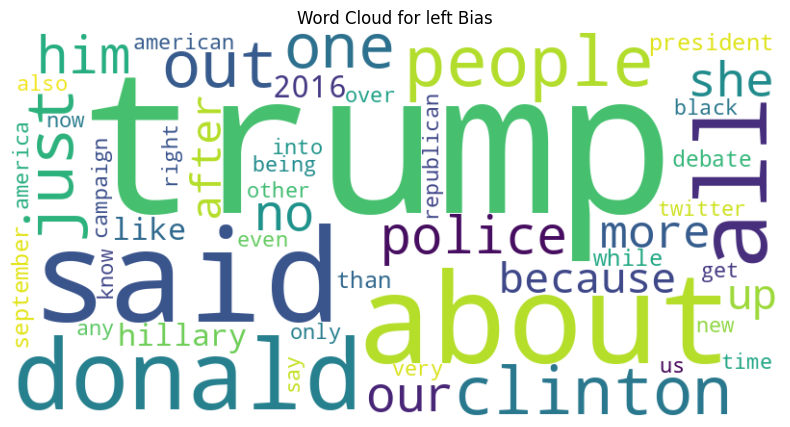

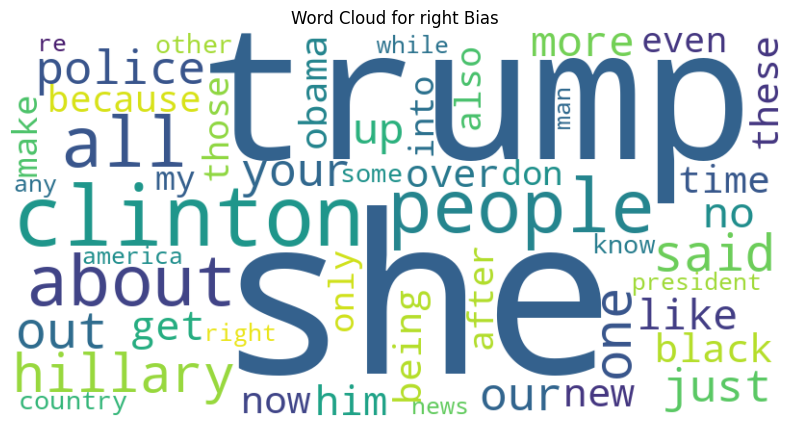

In [ ]:
common_words = find_common_context_words_and_generate_wordclouds(df_left_right2, 'statement', 'bias', ['left', 'right'], manual_stop_words)

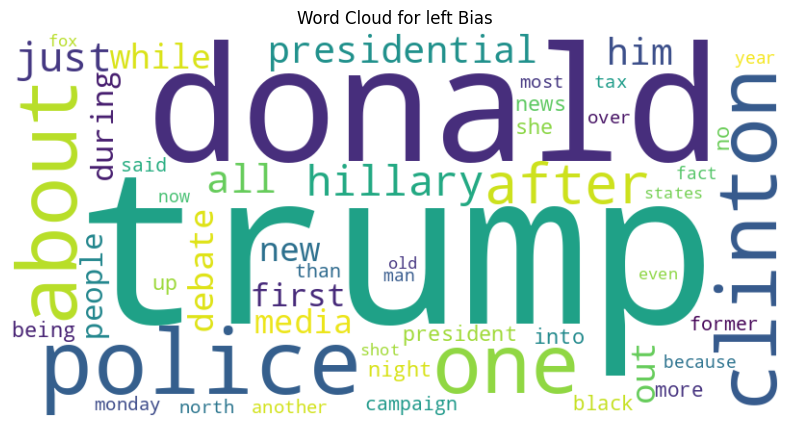

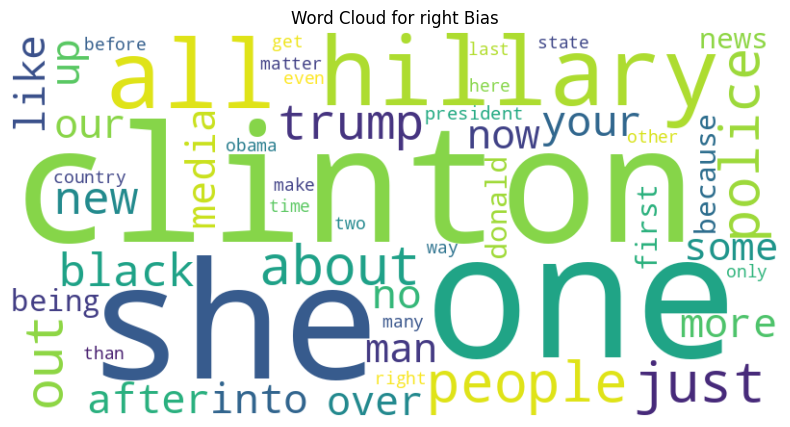

In [ ]:
common_words = find_common_context_words_and_generate_wordclouds(df_left_right2, 'neutral_statement', 'bias', ['left', 'right'], manual_stop_words)

In [ ]:
import re
from collections import Counter

def find_and_print_common_context_words(dataframe, text_column, bias_column, bias_types, stop_words, num_common_words=10):
    def tokenize(text):
        text = text.lower()  # Convert to lowercase
        tokens = re.findall(r'\b\w+\b', text)  # Extract words
        return tokens

    # Dictionary to store common context-specific words for each bias type
    common_words_by_bias = {}

    for bias in bias_types:
        # Tokenize statements by bias type, filtering out possible null values
        bias_tokens = dataframe[dataframe[bias_column] == bias][text_column].dropna().apply(tokenize).sum()

        # Filter out all stop words from tokens
        context_words_filtered = [word for word in bias_tokens if word not in stop_words]

        # Get the most common context-specific words for the current bias type
        common_context_words = Counter(context_words_filtered).most_common(num_common_words)

        # Store the result in the dictionary
        common_words_by_bias[bias] = common_context_words

        # Print the common context-specific words
        print(f"Most common context-specific words for {bias} bias:")
        for word, count in common_context_words:
            print(f"{word}: {count}")
        print("\n")

    return common_words_by_bias

In [ ]:
cword_ls = find_and_print_common_context_words(df_left_right2, 'statement', 'bias', ['left', 'right'], manual_stop_words)

Most common context-specific words for left bias:
trump: 1019
said: 296
about: 279
donald: 263
all: 261
people: 257
clinton: 247
out: 234
just: 233
one: 211


Most common context-specific words for right bias:
she: 699
trump: 609
clinton: 560
people: 541
about: 479
all: 478
hillary: 469
one: 449
out: 430
said: 430




In [ ]:
n_cword_ls = find_and_print_common_context_words(df_left_right2, 'neutral_statement', 'bias', ['left', 'right'], manual_stop_words)

Most common context-specific words for left bias:
trump: 162
donald: 79
police: 57
about: 49
one: 48
clinton: 48
after: 46
hillary: 42
just: 39
all: 37


Most common context-specific words for right bias:
one: 101
clinton: 88
she: 88
hillary: 85
all: 85
people: 84
just: 82
about: 80
police: 79
out: 77


